In [103]:
import networkx as nx
import matplotlib.pyplot as plt

Friendships Hamster

num_edges =  12534
num_nodes =  1858
number of communities =  35
modularity =  0.4529632328103304
-------------------------

Top 5 Big Communities : 

community =  10	  length = 383	 percentage = 21
community =   0	  length = 275	 percentage = 15
community =  32	  length = 219	 percentage = 12
community =   3	  length = 189	 percentage = 10
community =   7	  length = 180	 percentage = 10


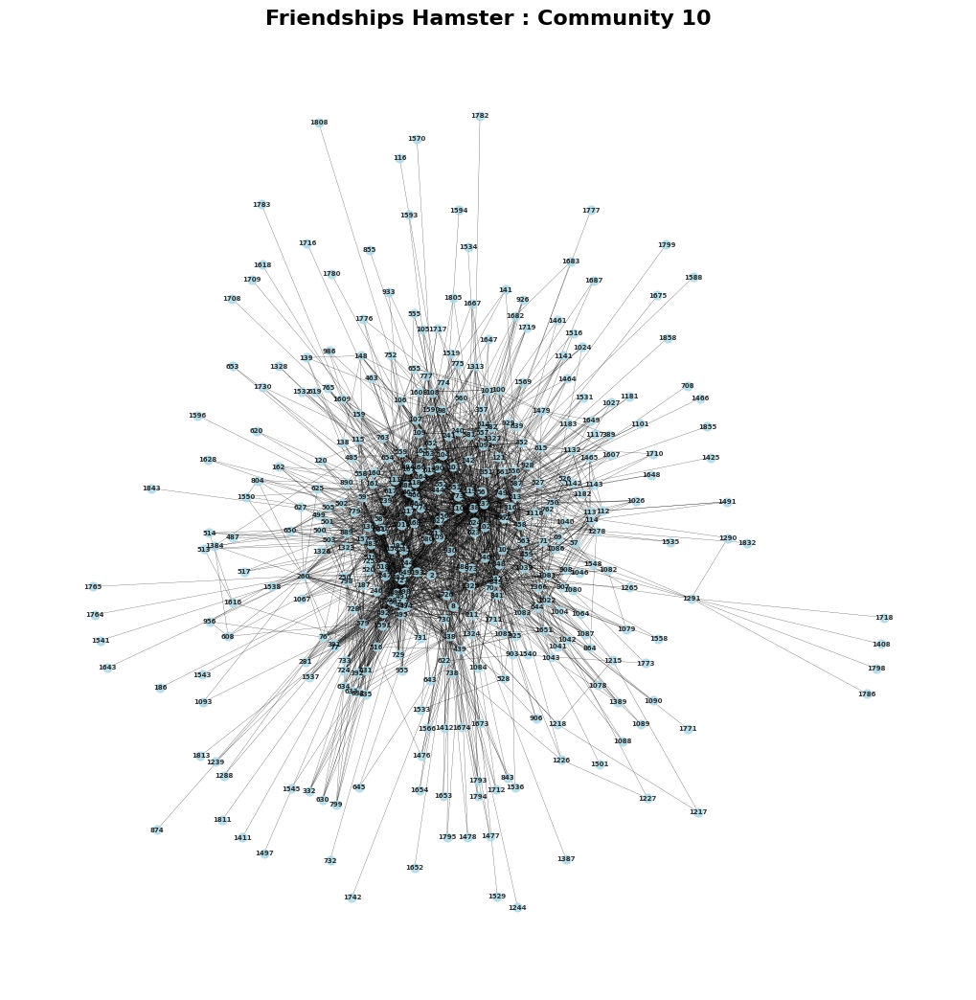

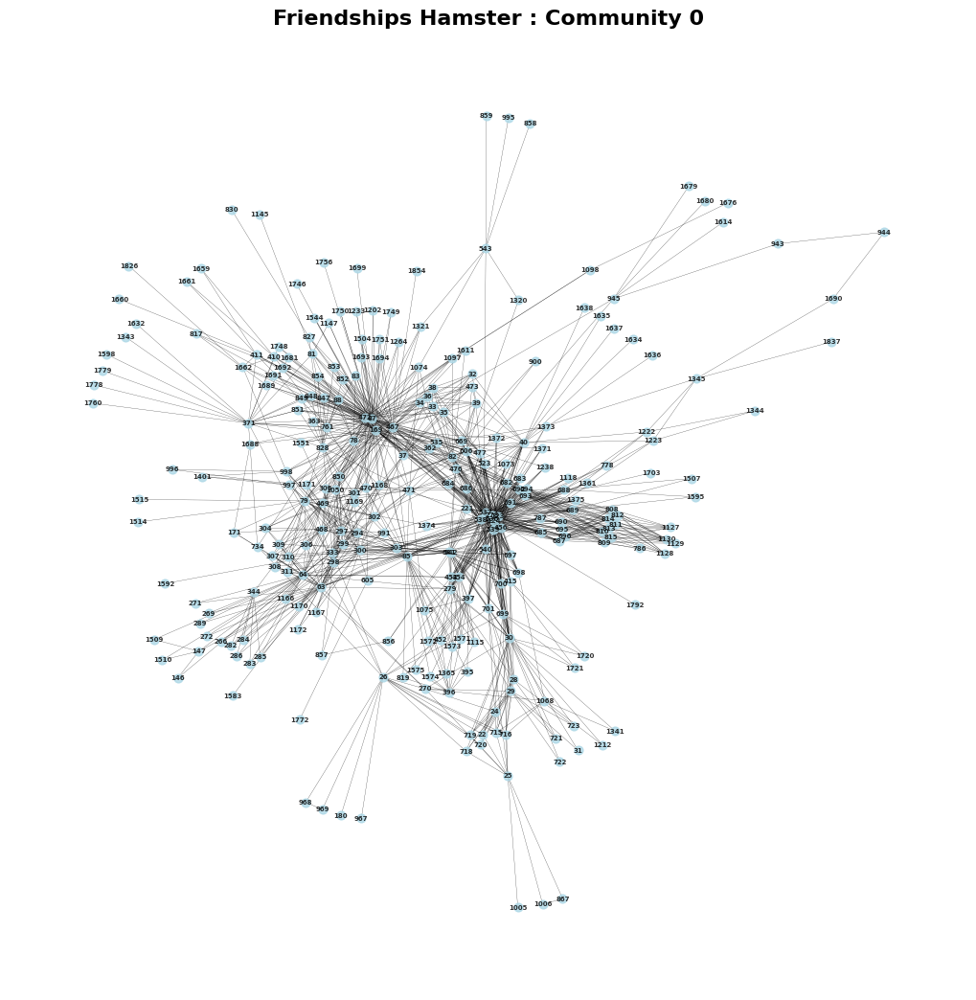

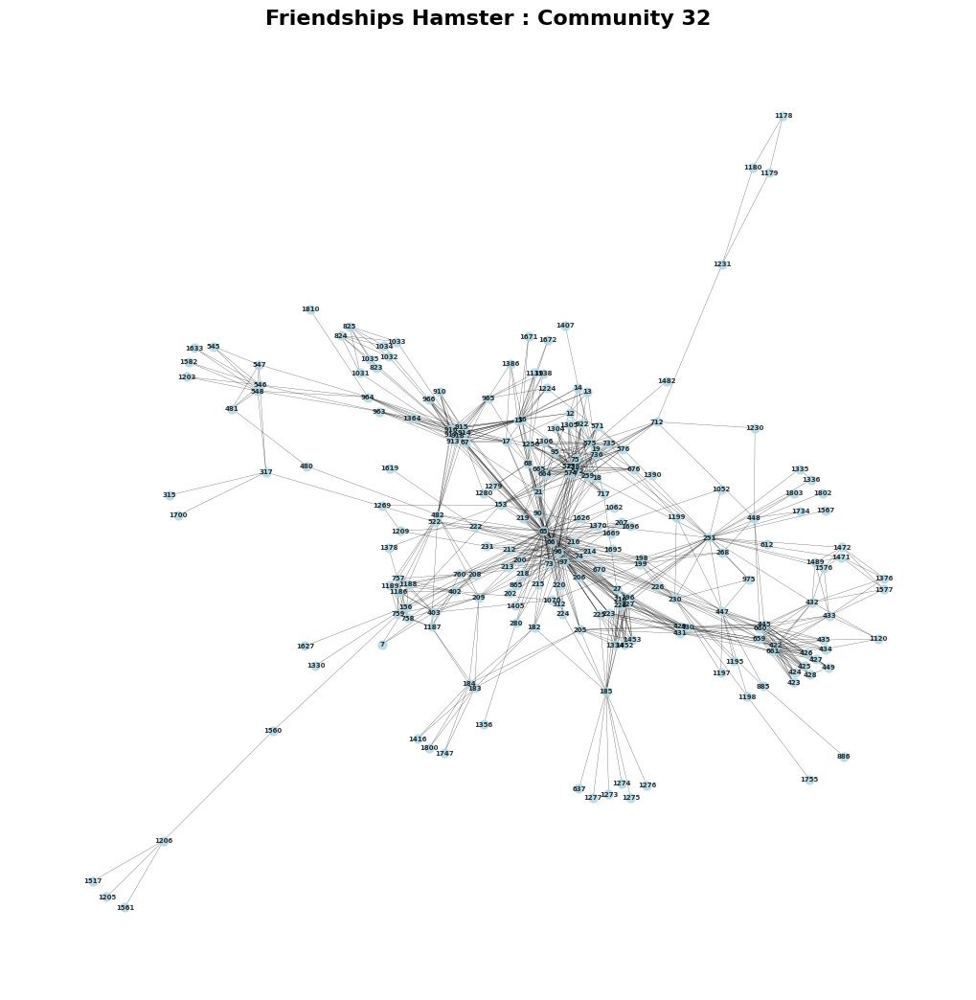

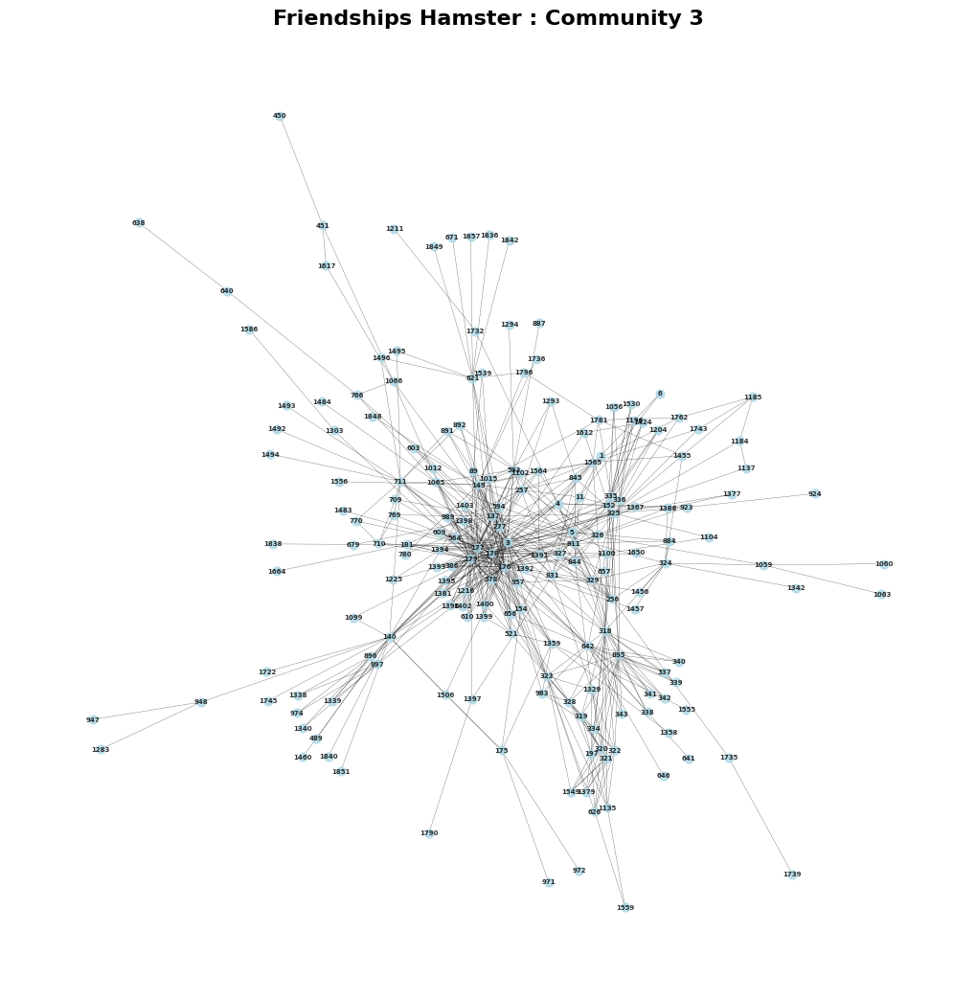

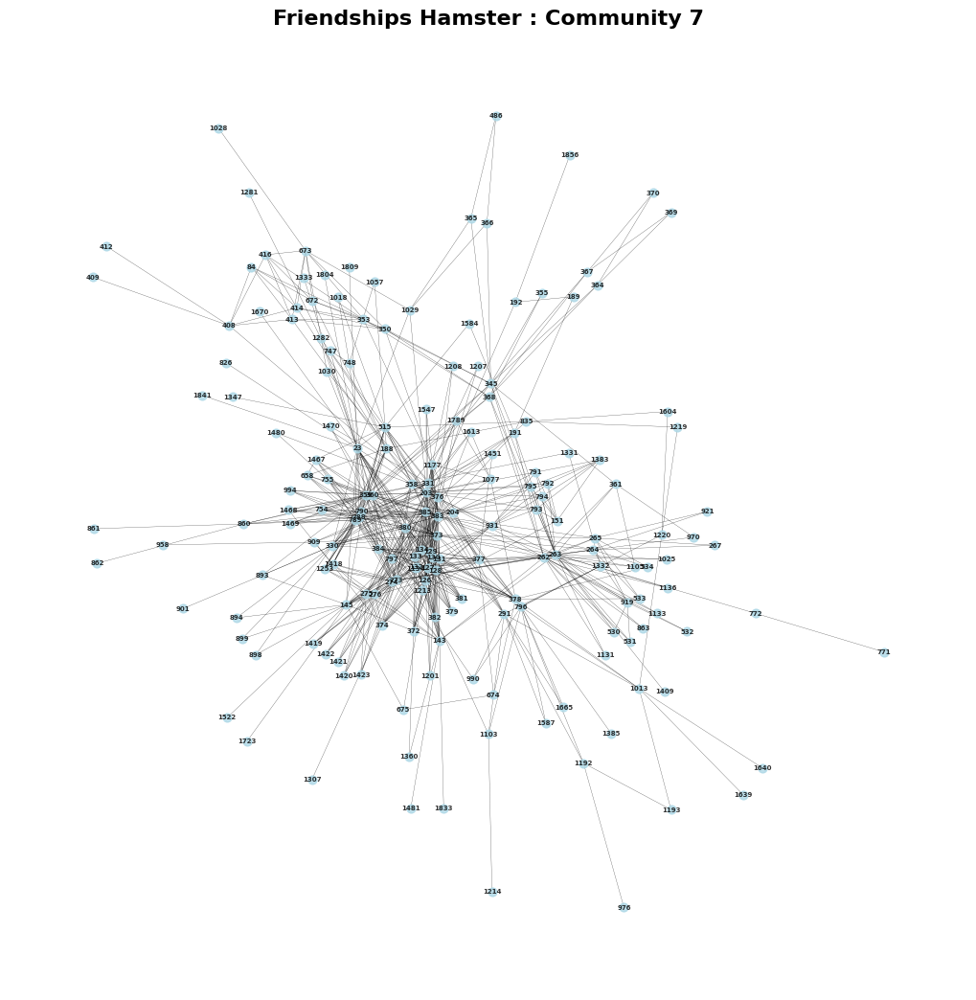

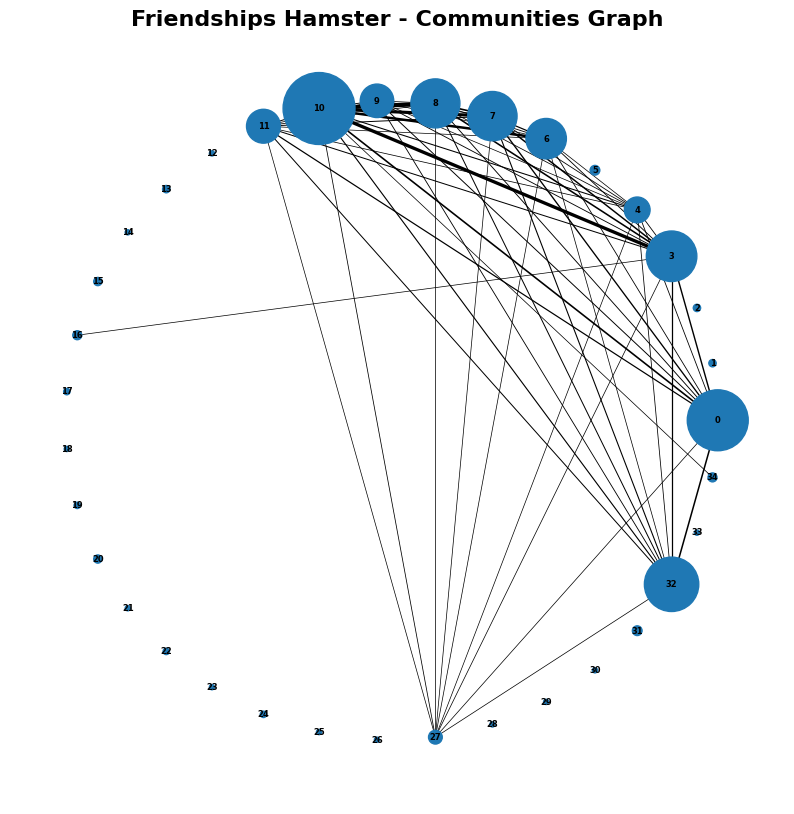

In [104]:
# Import data and Create a graph
path = 'datasets\\friendships-hamster.txt'
G = nx.read_edgelist(path, comments='#', nodetype=int)
G = nx.read_edgelist(path, comments='#', nodetype=int)
num_edges = len(G.edges)
print('num_edges = ',num_edges)
num_nodes = len(G.nodes)
print('num_nodes = ',num_nodes)


# Apply the Louvain algorithm for partitioning
C = nx.community.louvain_communities(G, seed=1984)
modularity = nx.community.modularity(G, C)
print('number of communities = ',len(C))
print('modularity = ',modularity)

# Make a dict of communities
communities = {}
for community_id, nodes in enumerate(C):
    communities[community_id] = [*list(nodes)]

# Print top 5 communities
print('-------------------------')
print('\nTop 5 Big Communities : \n')
sorted_communities = sorted(communities.items(), key=lambda x: len(x[1]), reverse=True)
for community , nodes in sorted_communities[:5]:
    print(f"community = {community:3.0f}\t  length = {len(nodes):3.0f}\t percentage = {(len(nodes)/num_nodes * 100):2.0f}")

# Show graph of each big community
for community_id, nodes in sorted_communities[:5]:
    subgraph = G.subgraph(nodes)
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_color='lightblue', node_size=40,
            font_size=5, font_weight='bold', alpha=0.8, width=0.2)
    plt.title(f"Friendships Hamster : Community {community_id}", fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.show()

# Create a new graph to represent the communities and their links
communities_graph = nx.Graph()

# Add nodes for each community
for community_id, nodes in communities.items():
    communities_graph.add_node(community_id, size=len(nodes))

# Add links between communities based on the original graph edges
for u, v in G.edges:
    u_community = None
    v_community = None
    for community_id, nodes in communities.items():
        if u in nodes:
            u_community = community_id
        if v in nodes:
            v_community = community_id
    if u_community != v_community:
        if communities_graph.has_edge(u_community, v_community):
            communities_graph[u_community][v_community]['weight'] += 1
        else:
            communities_graph.add_edge(u_community, v_community, weight=1)

# Visualize the communities and links
plt.figure(figsize=(10, 10))
pos = nx.circular_layout(communities_graph)
#pos = nx.random_layout(communities_graph, seed=120)

node_sizes = [communities_graph.nodes[community_id]['size'] * 7 for community_id in communities_graph.nodes()]
edge_weights = [communities_graph[u][v]['weight'] for u, v in communities_graph.edges()]
edge_widths = [0.5 + 2.5 * w / max(edge_weights) for w in edge_weights]
nx.draw_networkx_nodes(communities_graph, pos, node_size=node_sizes)
nx.draw_networkx_edges(communities_graph, pos, width=edge_widths)

nx.draw_networkx_labels(communities_graph, pos, font_size=6, font_weight='bold')

plt.title('Friendships Hamster - Communities Graph', fontsize=16, fontweight='bold')
#plt.text(-0.3, 1.3, 'Friendships Hamster', fontsize=16, fontweight='bold')
#plt.text(-0.20, 1.2, 'Communities Graph', fontsize=14)
plt.axis('off')
plt.show()

Social Circles: Facebook

num_edges =  88234
num_nodes =  4039
number of communities =  16
modularity =  0.8349337765640645
-------------------------

Top 5 Big Communities : 

community =  14	  length = 548	 percentage = 14
community =   8	  length = 535	 percentage = 13
community =   3	  length = 435	 percentage = 11
community =   5	  length = 430	 percentage = 11
community =  12	  length = 423	 percentage = 10


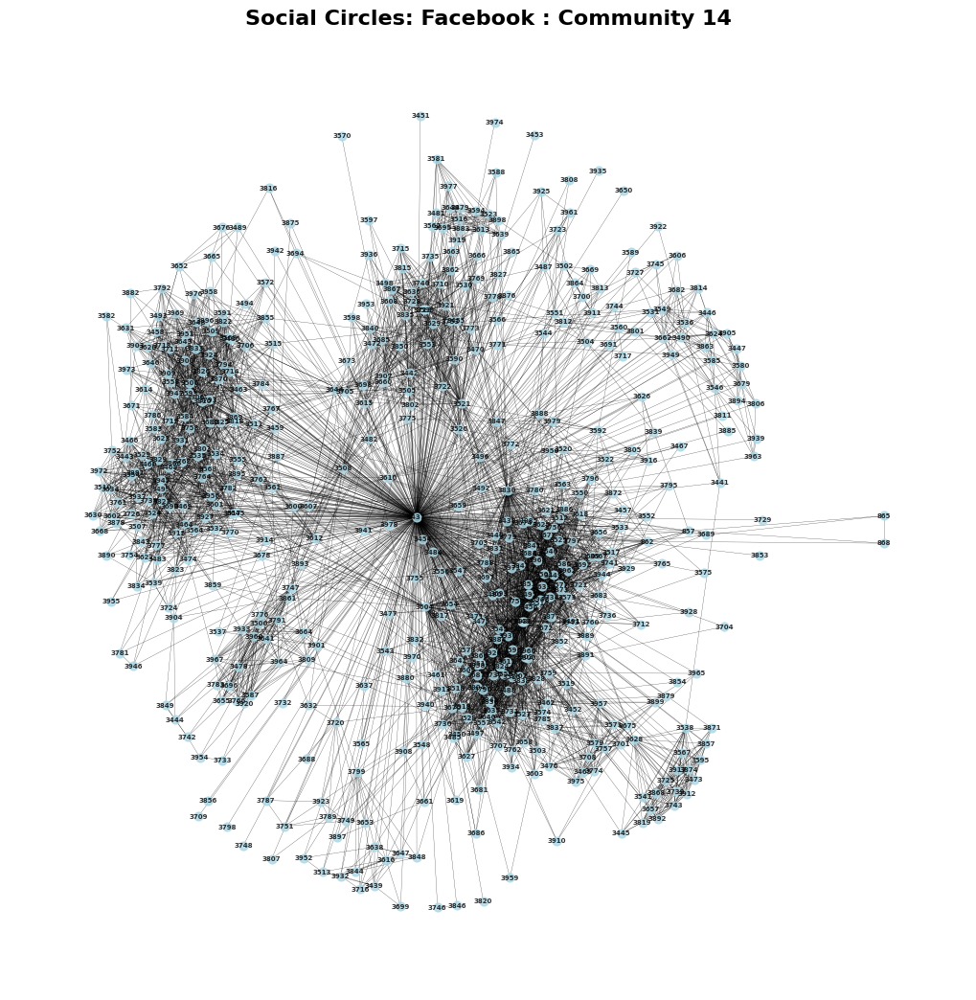

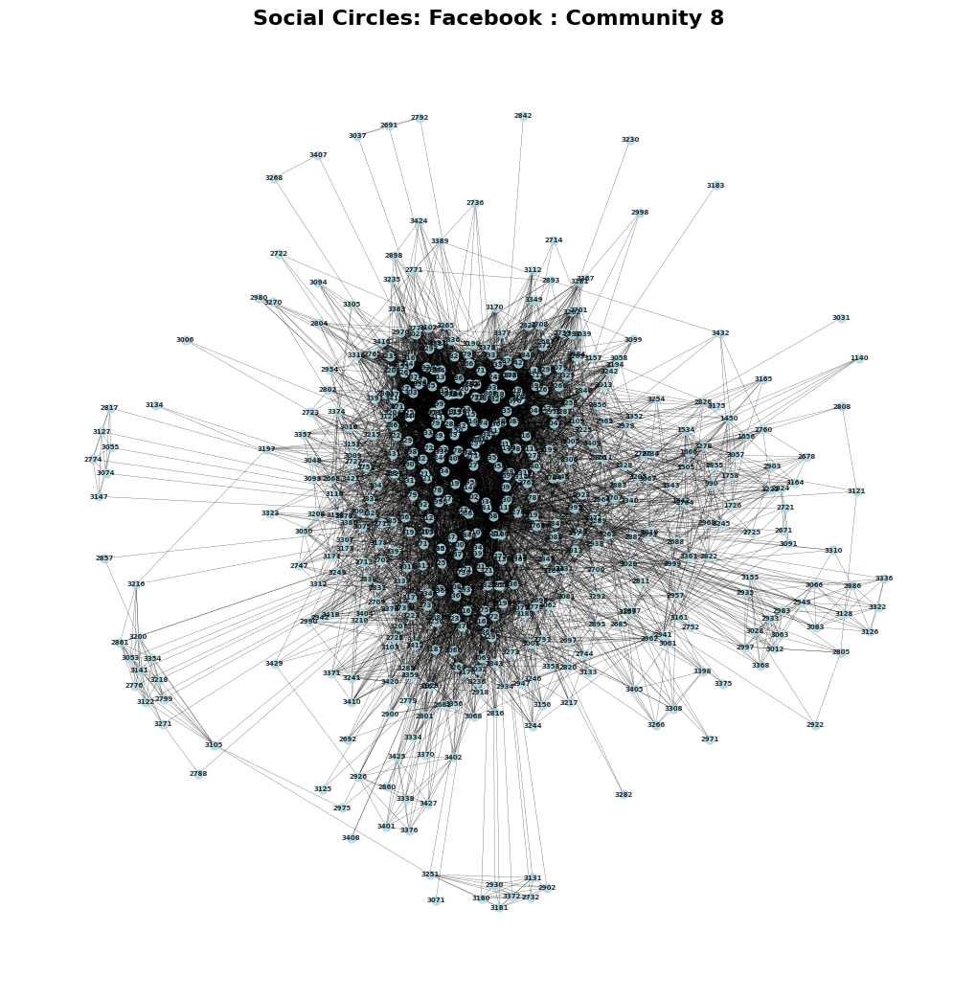

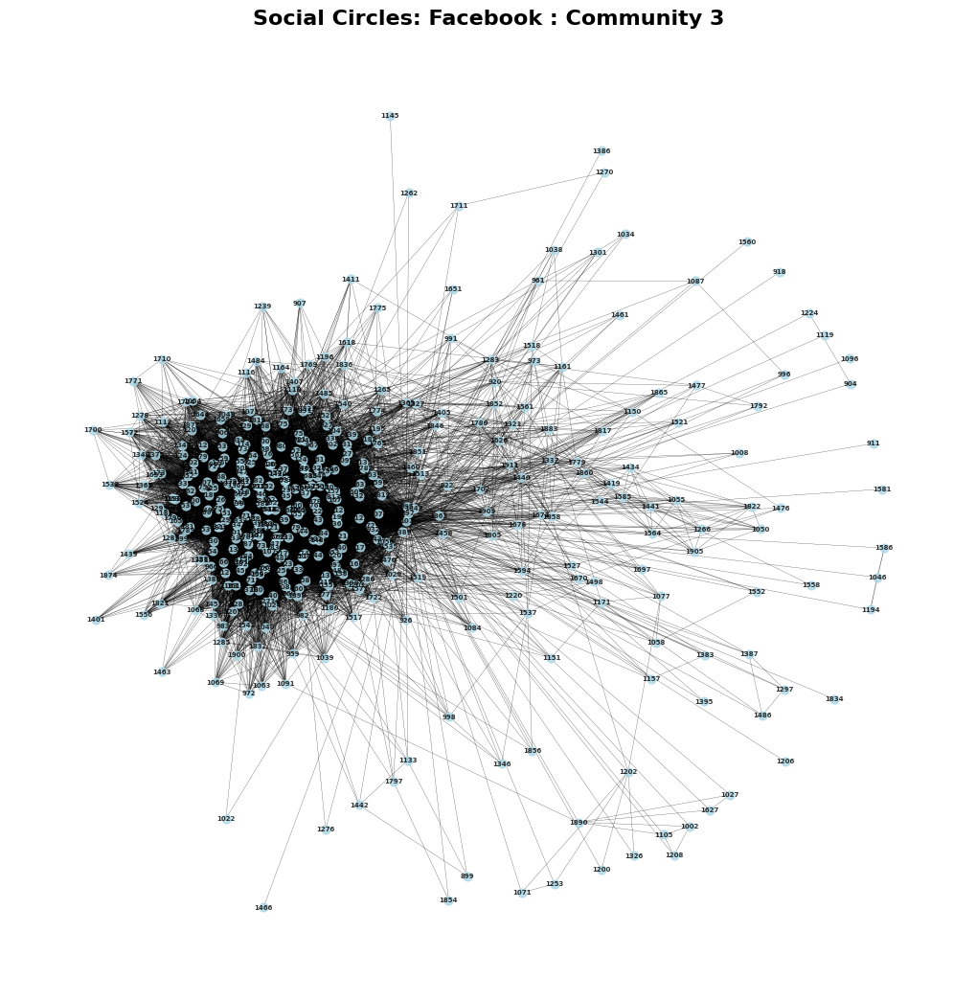

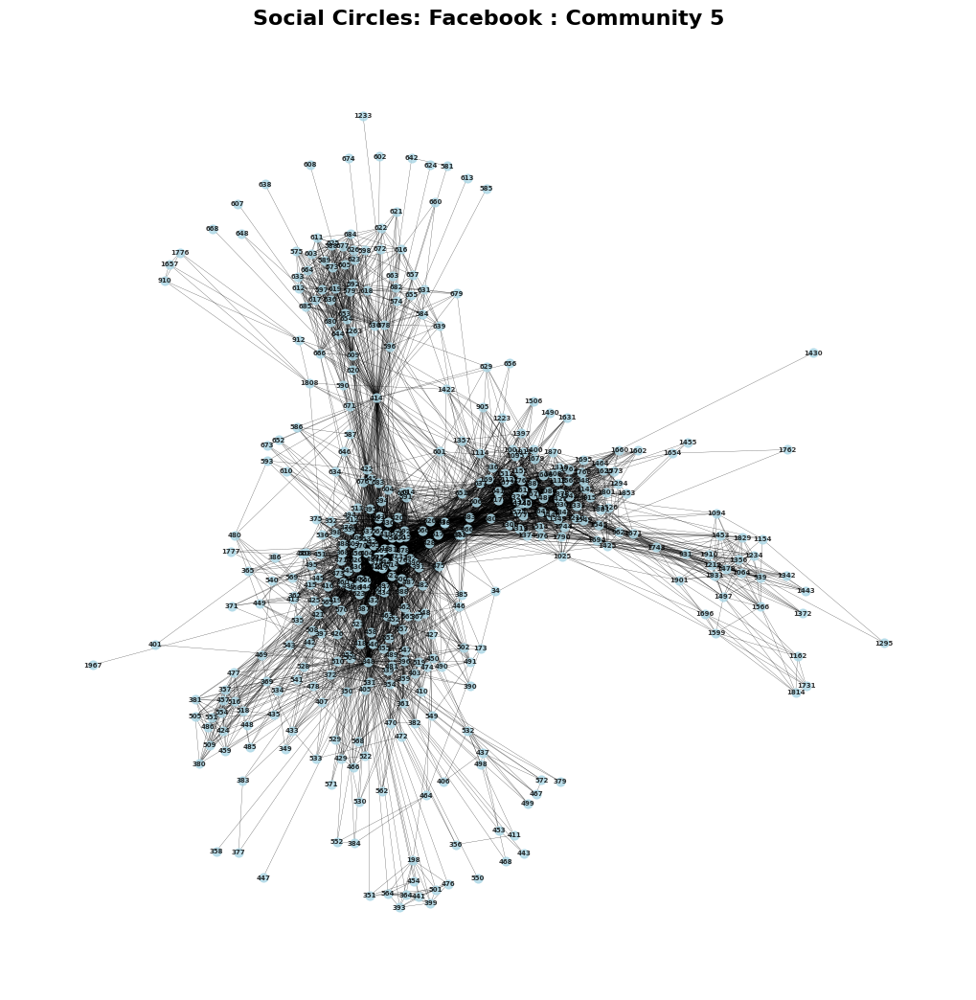

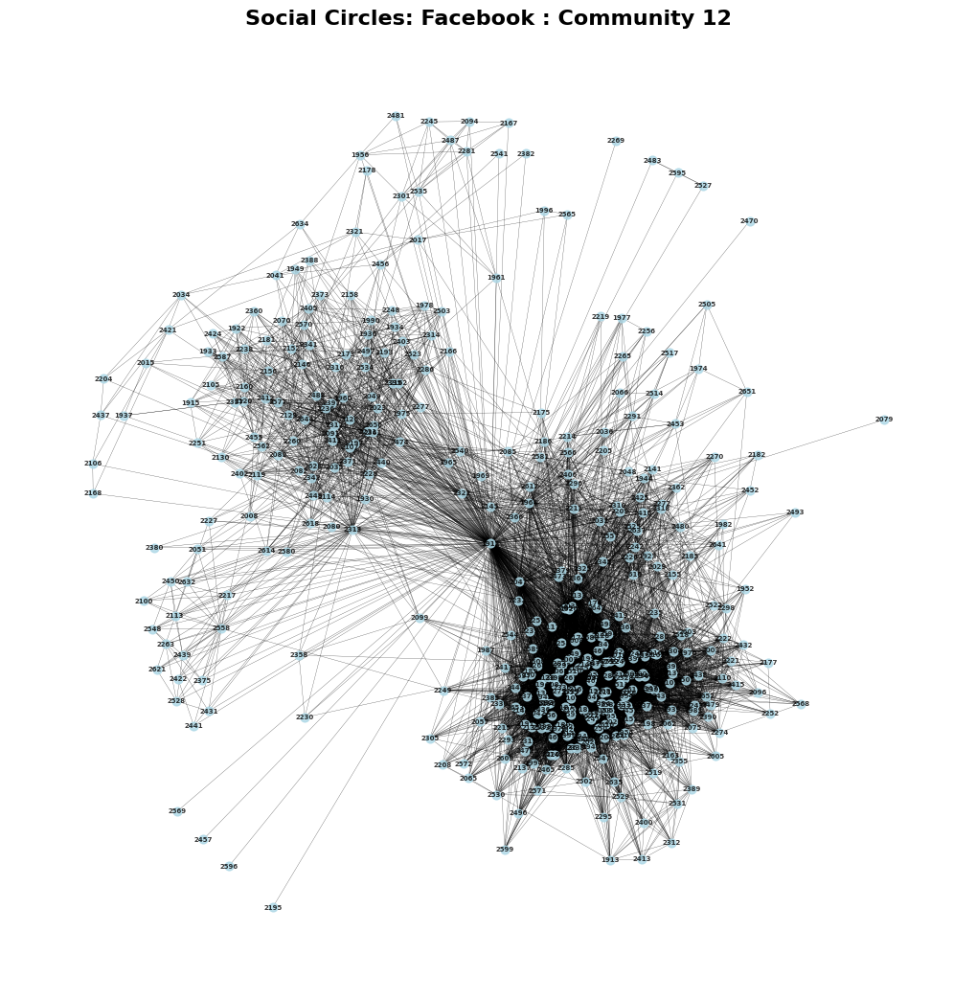

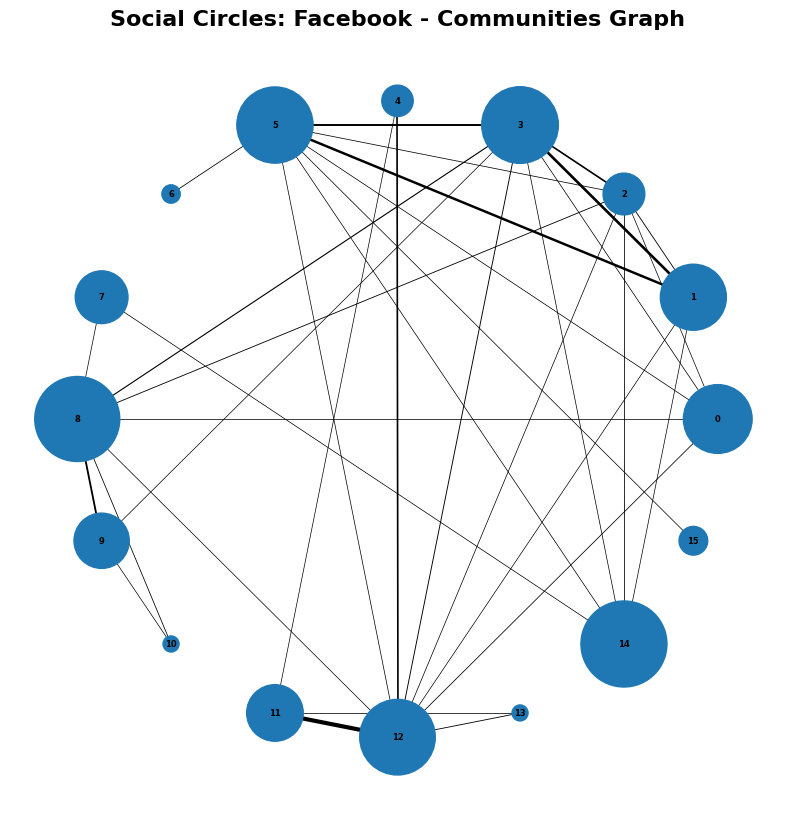

In [105]:
# Import data and Create a graph
path = 'datasets\\facebook_combined.txt'
G = nx.read_edgelist(path, comments='#', nodetype=int)
G = nx.read_edgelist(path, comments='#', nodetype=int)
num_edges = len(G.edges)
print('num_edges = ',num_edges)
num_nodes = len(G.nodes)
print('num_nodes = ',num_nodes)

# Apply the Louvain algorithm for partitioning
C = nx.community.louvain_communities(G, seed=1984)
modularity = nx.community.modularity(G, C)
print('number of communities = ',len(C))
print('modularity = ',modularity)

# Make a dict of communities
communities = {}
for community_id, nodes in enumerate(C):
    communities[community_id] = [*list(nodes)]

# print top 5 communities
print('-------------------------')
print('\nTop 5 Big Communities : \n')
sorted_communities = sorted(communities.items(), key=lambda x: len(x[1]), reverse=True)
for community , nodes in sorted_communities[:5]:
    print(f"community = {community:3.0f}\t  length = {len(nodes):3.0f}\t percentage = {(len(nodes)/num_nodes * 100):2.0f}")

# Show graph of each big community
for community_id, nodes in sorted_communities[:5]:
    subgraph = G.subgraph(nodes)
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_color='lightblue', node_size=40,
            font_size=5, font_weight='bold', alpha=0.8, width=0.2)
    plt.title(f"Social Circles: Facebook : Community {community_id}", fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.show()

# Create a new graph to represent the communities and their links
communities_graph = nx.Graph()

# Add nodes for each community
for community_id, nodes in communities.items():
    communities_graph.add_node(community_id, size=len(nodes))

# Add links between communities based on the original graph edges
for u, v in G.edges:
    u_community = None
    v_community = None
    for community_id, nodes in communities.items():
        if u in nodes:
            u_community = community_id
        if v in nodes:
            v_community = community_id
    if u_community != v_community:
        if communities_graph.has_edge(u_community, v_community):
            communities_graph[u_community][v_community]['weight'] += 1
        else:
            communities_graph.add_edge(u_community, v_community, weight=1)

# Visualize the communities and links
plt.figure(figsize=(10, 10))
pos = nx.circular_layout(communities_graph)

node_sizes = [communities_graph.nodes[community_id]['size'] * 7 for community_id in communities_graph.nodes()]
edge_weights = [communities_graph[u][v]['weight'] for u, v in communities_graph.edges()]
edge_widths = [0.5 + 2.5 * w / max(edge_weights) for w in edge_weights]
nx.draw_networkx_nodes(communities_graph, pos, node_size=node_sizes)
nx.draw_networkx_edges(communities_graph, pos, width=edge_widths)

nx.draw_networkx_labels(communities_graph, pos, font_size=6, font_weight='bold')

plt.title('Social Circles: Facebook - Communities Graph', fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()

Citation Network

num_edges =  352324
num_nodes =  27770
number of communities =  172
modularity =  0.6584493572767836
-------------------------

Top 5 Big Communities : 

community =  29	  length = 3057	 percentage = 11
community =  24	  length = 2458	 percentage =  9
community =  11	  length = 2344	 percentage =  8
community =  64	  length = 2280	 percentage =  8
community =  23	  length = 2199	 percentage =  8


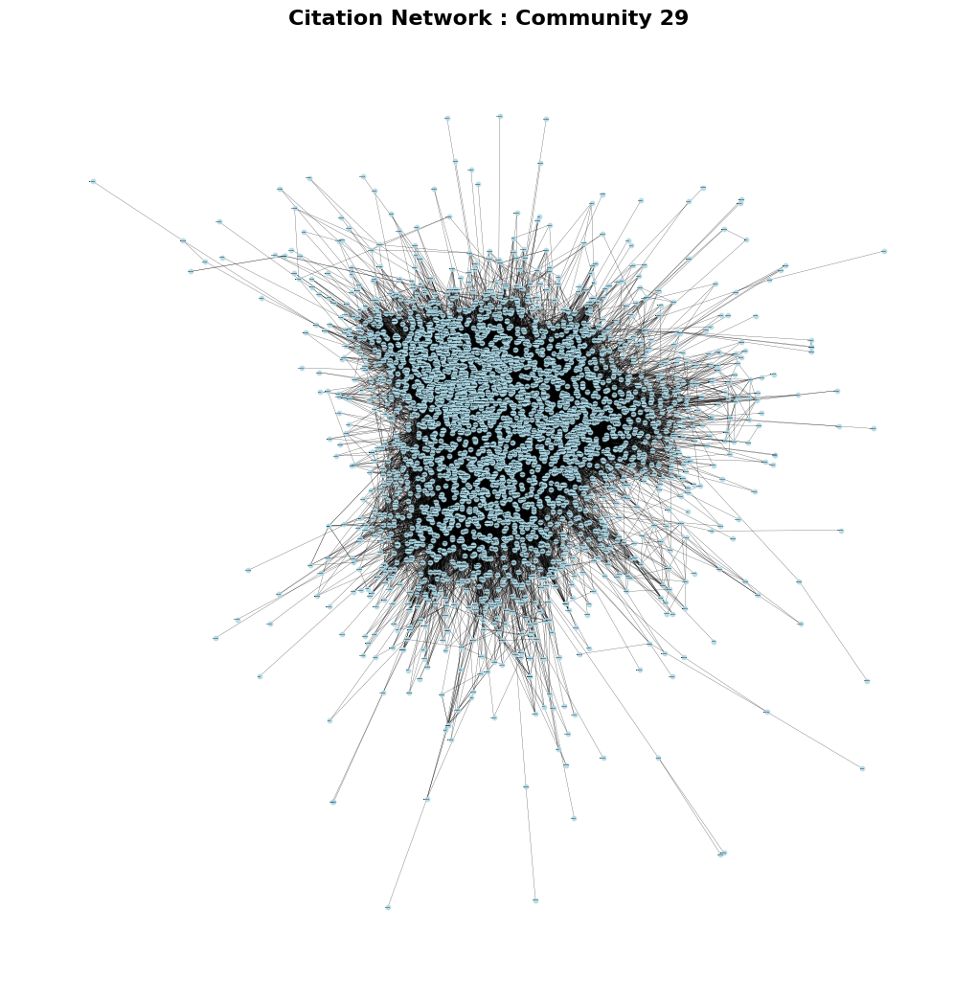

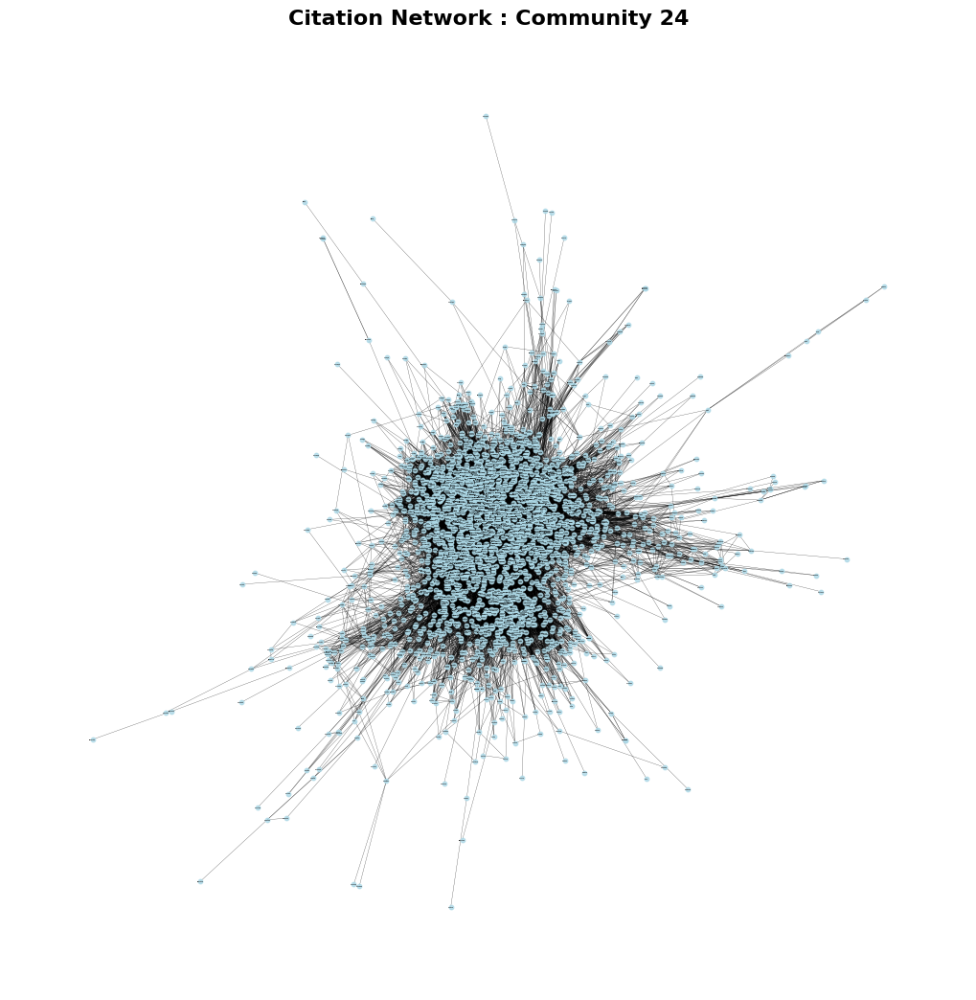

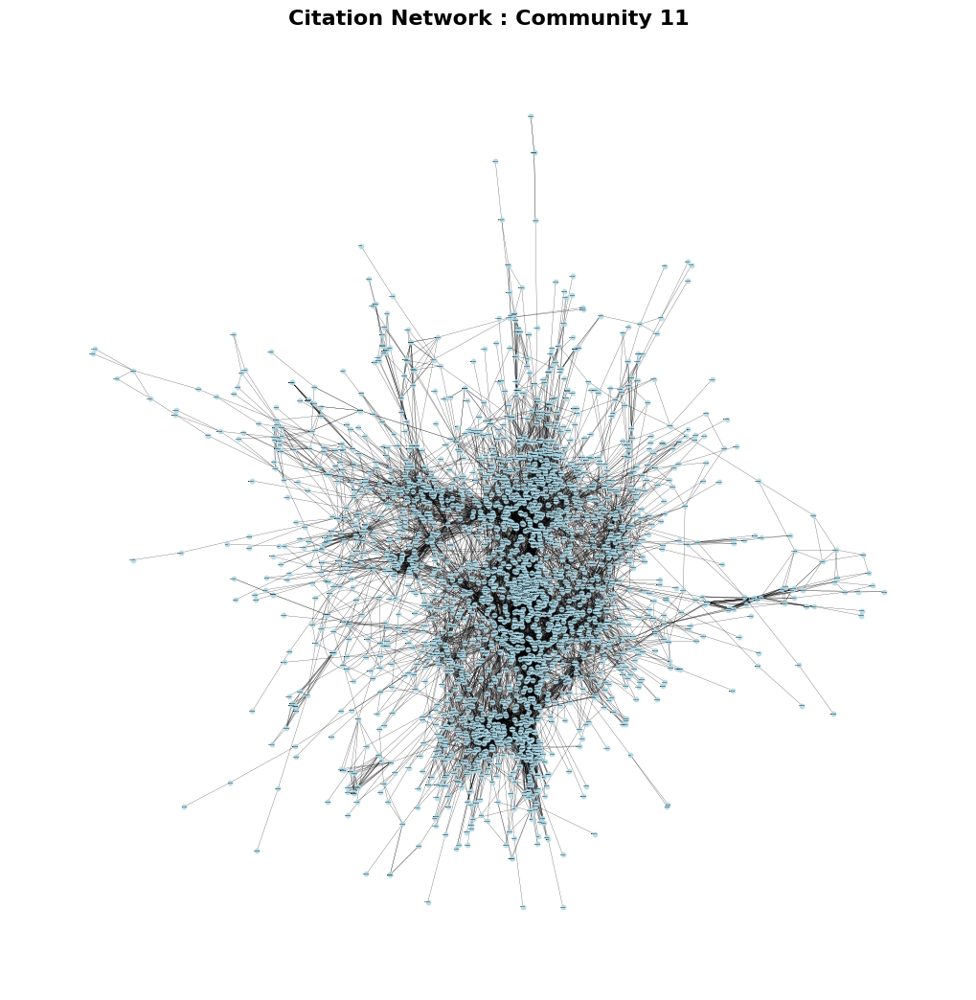

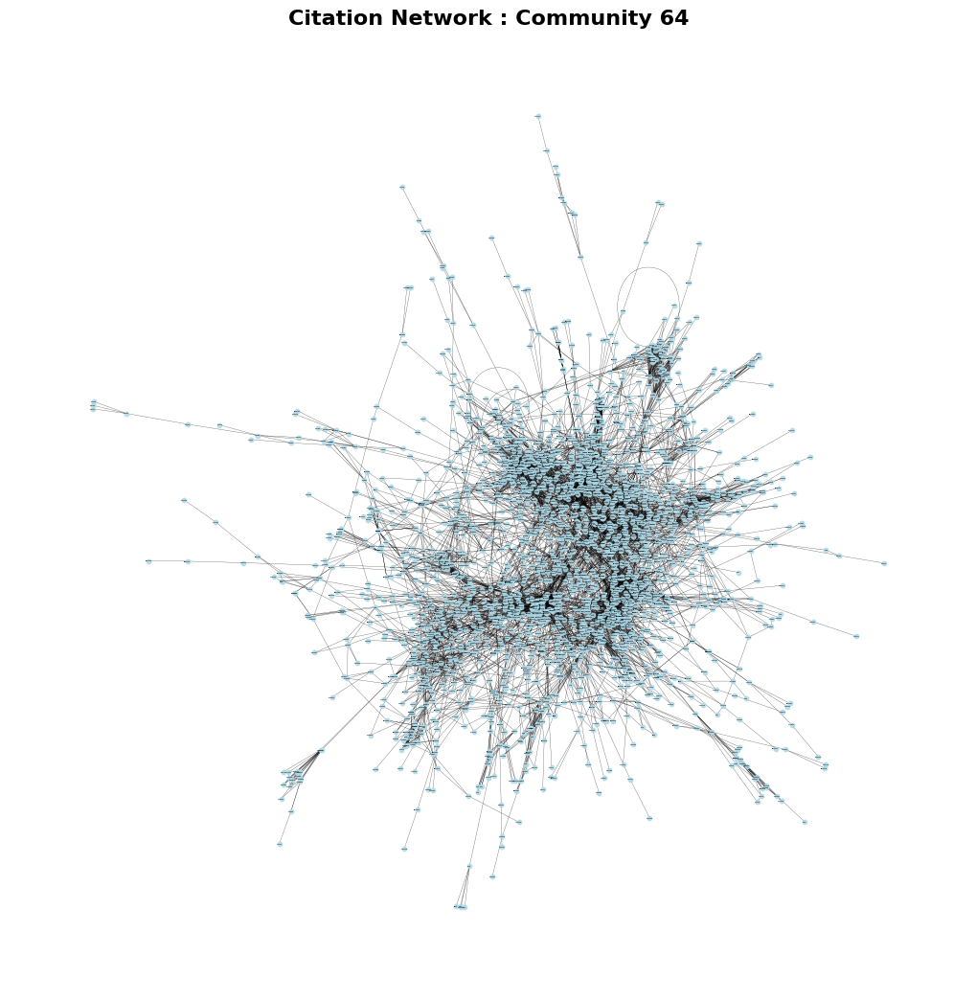

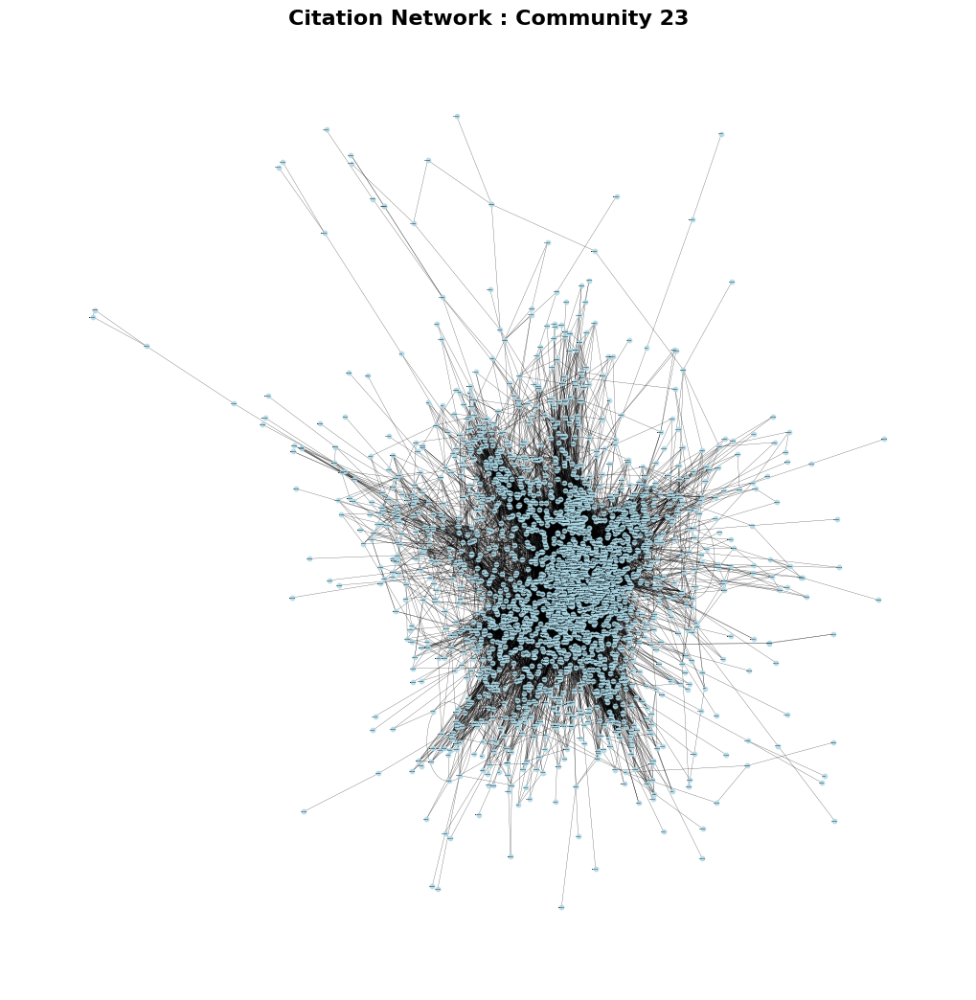

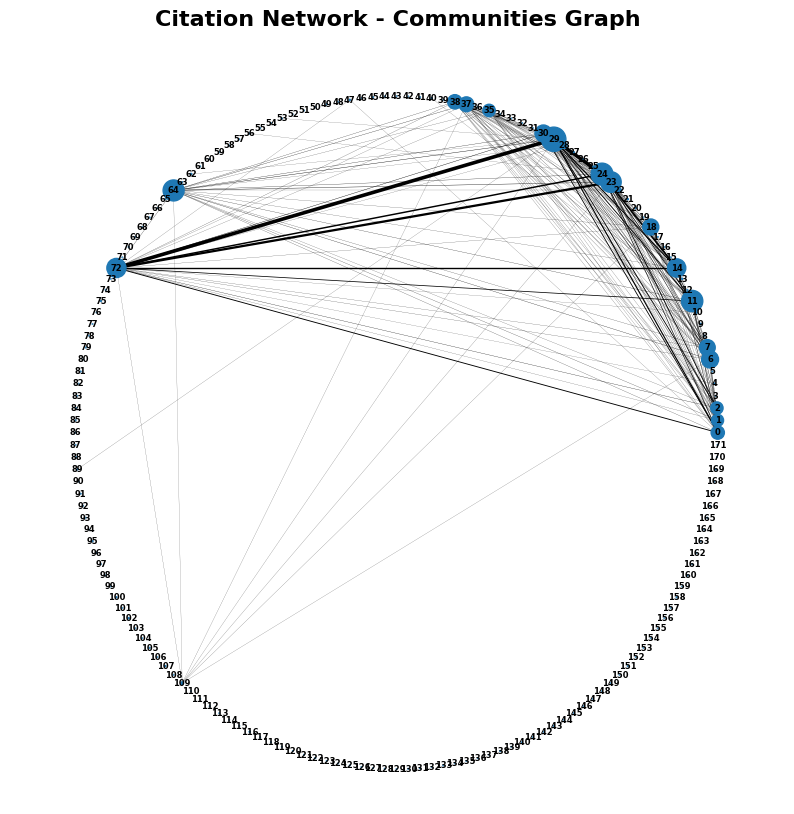

In [109]:
# Import data and Create a graph
path = 'datasets\\Cit-HepTh.txt'
G = nx.read_edgelist(path, comments='#', nodetype=int)
G = nx.read_edgelist(path, comments='#', nodetype=int)
num_edges = len(G.edges)
print('num_edges = ',num_edges)
num_nodes = len(G.nodes)
print('num_nodes = ',num_nodes)

# Apply the Louvain algorithm for partitioning
C = nx.community.louvain_communities(G, seed=1984)
modularity = nx.community.modularity(G, C)
print('number of communities = ',len(C))
print('modularity = ',modularity)

# Make a dict of communities
communities = {}
for community_id, nodes in enumerate(C):
    communities[community_id] = [*list(nodes)]

# print top 5 communities
print('-------------------------')
print('\nTop 5 Big Communities : \n')
sorted_communities = sorted(communities.items(), key=lambda x: len(x[1]), reverse=True)
for community , nodes in sorted_communities[:5]:
    print(f"community = {community:3.0f}\t  length = {len(nodes):4.0f}\t percentage = {(len(nodes)/num_nodes * 100):2.0f}")

# Show graph of each big community
for community_id, nodes in sorted_communities[:5]:
    subgraph = G.subgraph(nodes)
    plt.figure(figsize=(10, 10))
    pos = nx.spring_layout(subgraph)
    nx.draw(subgraph, pos, with_labels=True, node_color='lightblue', node_size=10,
            font_size=1, font_weight='bold', alpha=0.8, width=0.2)
    plt.title(f"Citation Network : Community {community_id}", fontsize=16, fontweight='bold')
    plt.axis('off')
    plt.show()

# Create a new graph to represent the communities and their links
communities_graph = nx.Graph()

# Add nodes for each community
for community_id, nodes in communities.items():
    communities_graph.add_node(community_id, size=len(nodes))

# Add links between communities based on the original graph edges
for u, v in G.edges:
    u_community = None
    v_community = None
    for community_id, nodes in communities.items():
        if u in nodes:
            u_community = community_id
        if v in nodes:
            v_community = community_id
    if u_community != v_community:
        if communities_graph.has_edge(u_community, v_community):
            communities_graph[u_community][v_community]['weight'] += 1
        else:
            communities_graph.add_edge(u_community, v_community, weight=1)

# Visualize the communities and links
plt.figure(figsize=(10, 10))
pos = nx.circular_layout(communities_graph)
#pos = nx.random_layout(communities_graph, seed=120)

node_sizes = [communities_graph.nodes[community_id]['size'] * 0.1 for community_id in communities_graph.nodes()]
edge_weights = [communities_graph[u][v]['weight'] for u, v in communities_graph.edges()]
edge_widths = [0.1 + 2.5 * w / max(edge_weights) for w in edge_weights]
nx.draw_networkx_nodes(communities_graph, pos, node_size=node_sizes)
nx.draw_networkx_edges(communities_graph, pos, width=edge_widths)

nx.draw_networkx_labels(communities_graph, pos, font_size=6, font_weight='bold')

plt.title('Citation Network - Communities Graph', fontsize=16, fontweight='bold')
plt.axis('off')
plt.show()